In [146]:
using Pkg
using DataFrames
using CSV
using Plots
using Distributions
using GaussianMixtures
using Random, LinearAlgebra, Statistics, Distributions, StatsBase
using BAT, DensityInterface, IntervalSets
using Optim, Chain
using ValueShapes, ArraysOfArrays, Tables, TypedTables

#using PyPlot

In [147]:
df = CSV.read("GRB_data.txt",  DataFrame, header=[:logt90, :dlogt90, :logHR])

Row,logt90,dlogt90,logHR
,Float64,Float64,Float64
1,1.64558,0.0349151,0.419301
2,5.3403,0.00536016,0.0336968
3,1.14295,0.188138,0.589931
4,4.50176,0.00317158,0.501586
5,6.06382,0.00254409,0.036883
6,4.58676,0.0230403,0.52872
7,5.94345,0.0267333,0.0625971
8,4.31759,0.0170648,0.0542884
9,4.12636,0.00807076,0.427434


In [126]:
df.logt90

1932-element Vector{Float64}:
  1.6455769590499738
  5.340303483215096
  1.1429481024881614
  4.501763316276215
  6.0638224172976845
  4.586761786304737
  5.943450082006223
  4.317594774514492
  4.126359891654112
  5.204094595300666
 -1.155182640156504
  3.928211265624671
  6.118132439711102
  ⋮
  3.6295539880291217
  1.8258387828809177
  4.107589788972121
  3.852357923106411
 -0.6694306539426292
  3.188664009459961
  2.7191879455126657
  0.6184236343640089
  4.186498250392645
 -0.8627499649461253
  2.830857630363757
  4.169823023398005

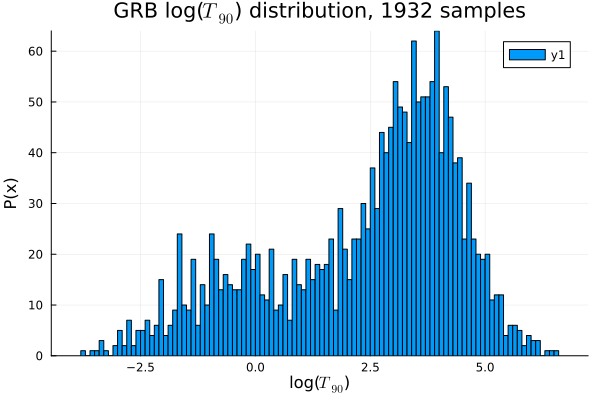

In [4]:
histogram(df.logt90,bins=100)
title!("GRB log(\$T_{90}\$) distribution, 1932 samples")
xlabel!("log(\$T_{90}\$)")
ylabel!("P(x)")

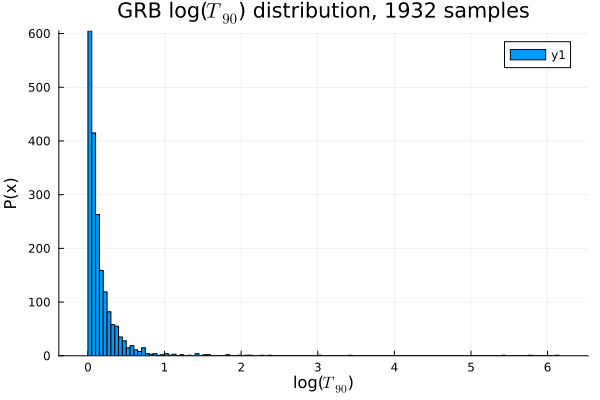

In [5]:
histogram(df.dlogt90)
title!("GRB log(\$T_{90}\$) distribution, 1932 samples")
xlabel!("log(\$T_{90}\$)")
ylabel!("P(x)")

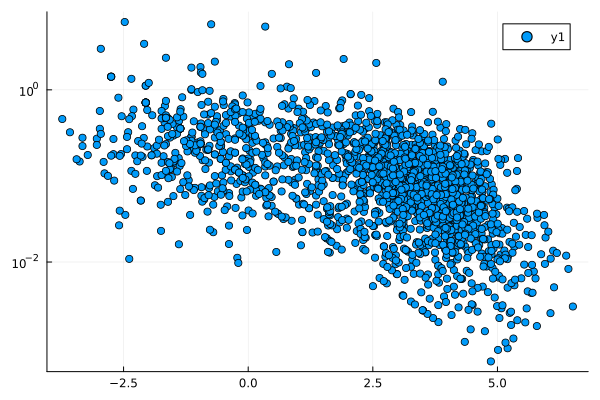

In [10]:
scatter(df.logt90,df.dlogt90,yaxis=:log)
#ylims!(0,1)

In [148]:
hist = append!(Histogram(-4.5:0.3:7.5), df.logt90)

Histogram{Int64, 1, Tuple{StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}}
edges:
  -4.5:0.3:7.5
weights: [0, 0, 1, 5, 3, 14, 12, 17, 25, 43  …  80, 59, 35, 16, 11, 6, 3, 0, 0, 0]
closed: left
isdensity: false

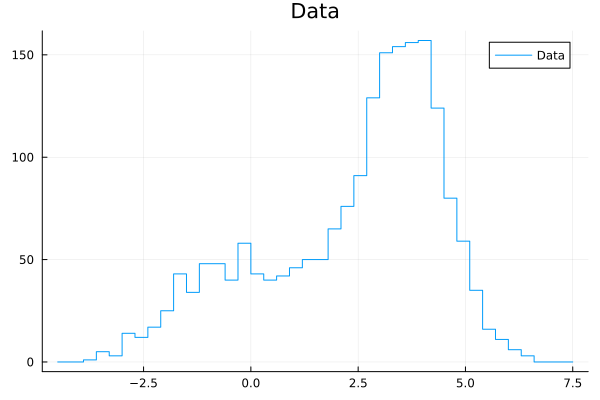

In [155]:
plot(
    hist,
    st = :steps, label = "Data",
    title = "Data"
)

In [62]:
hist = normalize(hist,mode=:pdf)

Histogram{Float64, 1, Tuple{StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}}
edges:
  -4.5:0.5:7.5
weights: [0.0, 0.002070393374741201, 0.007246376811594203, 0.021739130434782608, 0.038302277432712216, 0.054865424430641824, 0.060041407867494824, 0.08902691511387163, 0.08695652173913043, 0.07556935817805382  …  0.20186335403726707, 0.2639751552795031, 0.2795031055900621, 0.2246376811594203, 0.12318840579710146, 0.061076604554865424, 0.023809523809523808, 0.008281573498964804, 0.0010351966873706005, 0.0]
closed: left
isdensity: true

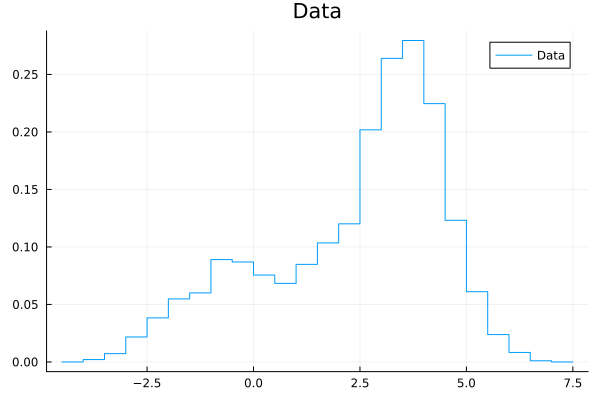

In [63]:
plot(
    hist,
    st = :steps, label = "Data",
    title = "Data"
)

In [156]:
function fit_function(p::NamedTuple{(:a, :mu, :sigma)}, x::Real)
    p.a * pdf(Normal(p.mu[1], p.sigma[1]), x) +
    1932*pdf(Normal(p.mu[2], p.sigma[2]), x) - p.a * pdf(Normal(p.mu[2], p.sigma[2]), x)
end

fit_function (generic function with 1 method)

In [157]:
likelihood = let h = hist, f = fit_function
    # Histogram counts for each bin as an array:
    observed_counts = h.weights

    # Histogram binning:
    bin_edges = h.edges[1]
    bin_edges_left = bin_edges[1:end-1]
    bin_edges_right = bin_edges[2:end]
    bin_widths = bin_edges_right - bin_edges_left
    bin_centers = (bin_edges_right + bin_edges_left) / 2

    logfuncdensity(function (params)
        # Log-likelihood for a single bin:
        function bin_log_likelihood(i)
            # Simple mid-point rule integration of fit function `f` over bin:
            expected_counts = bin_widths[i] * f(params, bin_centers[i])
            # Avoid zero expected counts for numerical stability:
            logpdf(Poisson(expected_counts + eps(expected_counts)), observed_counts[i])
        end

        # Sum log-likelihood over bins:
        idxs = eachindex(observed_counts)
        ll_value = bin_log_likelihood(idxs[1])
        for i in idxs[2:end]
            ll_value += bin_log_likelihood(i)
        end

        return ll_value
    end)
end

LogFuncDensity(var"#19#20"{StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}, Vector{Int64}, typeof(fit_function)}(-4.35:0.3:7.35, StepRangeLen(0.3, 0.0, 40), [0, 0, 1, 5, 3, 14, 12, 17, 25, 43  …  80, 59, 35, 16, 11, 6, 3, 0, 0, 0], fit_function))

In [158]:
prior = distprod(
    a = 500.0..1000.0,
    mu = [-2.0..2.0, 2.5..5.0],
    sigma = [0.0..10.0, 0.0..10.0]
)

NamedTupleDist((a = Uniform{Float64}(a=500.0, b=1000.0), mu = Product{Continuous, Uniform{Float64}, Vector{Uniform{Float64}}}(v=Uniform{Float64}[Uniform{Float64}(a=-2.0, b=2.0), Uniform{Float64}(a=2.5, b=5.0)]), sigma = Product{Continuous, Uniform{Float64}, Vector{Uniform{Float64}}}(v=Uniform{Float64}[Uniform{Float64}(a=0.0, b=10.0), Uniform{Float64}(a=0.0, b=10.0)])))

In [159]:
posterior = PosteriorMeasure(likelihood, prior)

PosteriorMeasure(objectid = 0x8a637bba5a3bc7bc, varshape = NamedTupleShape((:a, :mu, :sigma)}(…))

### Parameter Space Exploration via MCMC

We can now use Markov chain Monte Carlo (MCMC) to explore the space of
possible parameter values for the histogram fit.

To increase the verbosity level of BAT logging output, you may want to set
the Julia logging level for BAT to debug via `ENV["JULIA_DEBUG"] = "BAT"`.

In [153]:
ENV["JULIA_DEBUG"] = "BAT"

"BAT"

In [192]:
samples = bat_sample(
    posterior,
    MCMCSampling(
        mcalg = MetropolisHastings(
    weighting = RepetitionWeighting(),
    tuning = MCMCNoOpTuning()),
        nchains = 4,
        nsteps = 10^5,
        init = MCMCChainPoolInit(),
        burnin = MCMCMultiCycleBurnin(),
        convergence = BrooksGelmanConvergence(),
        strict = true,
        store_burnin = true,
        nonzero_weights = true,
        callback = (x...) -> nothing
    ),
).result


LoadError: MethodError: no method matching MetropolisHastings(::BAT.MvTDistProposal, ::RepetitionWeighting{Int64}, ::MCMCNoOpTuning)

[0mClosest candidates are:
[0m  MetropolisHastings(::Q, ::WS, [91m::TN[39m) where {Q<:BAT.ProposalDistSpec, WS<:AbstractMCMCWeightingScheme, TN<:MHProposalDistTuning}
[0m[90m   @[39m [36mBAT[39m [90m~/.julia/packages/Parameters/MK0O4/src/[39m[90m[4mParameters.jl:525[24m[39m


In [188]:
df_post = DataFrame(samples)

Row,v,logd,weight,info,aux
,NamedTup…,Float64,Int64,MCMCSamp…,Nothing
1,"(a = 618.168, mu = [1.32805, 4.70666], sigma = [6.45285, 0.690443])",-1506.76,2,"MCMCSampleID(6, 1, 0, 1)",
2,"(a = 990.134, mu = [1.88312, 4.86308], sigma = [3.83692, 0.0026849])",-1146.19,2,"MCMCSampleID(6, 1, 2, 1)",
3,"(a = 1000.0, mu = [1.88666, 5.0], sigma = [1.24957, 10.0])",-854.261,5,"MCMCSampleID(6, 1, 4, 1)",
4,"(a = 1000.0, mu = [1.99832, 5.0], sigma = [1.85909, 9.99408])",-591.796,58,"MCMCSampleID(6, 1, 9, 1)",
5,"(a = 1000.0, mu = [1.99044, 5.0], sigma = [1.96823, 9.98924])",-591.754,103,"MCMCSampleID(6, 1, 67, 1)",
6,"(a = 1000.0, mu = [1.99991, 5.0], sigma = [1.88645, 9.99901])",-590.554,16,"MCMCSampleID(6, 1, 170, 1)",
7,"(a = 1000.0, mu = [1.98849, 5.0], sigma = [1.7775, 9.13609])",-590.7,44,"MCMCSampleID(6, 1, 186, 1)",
8,"(a = 1000.0, mu = [1.96248, 5.0], sigma = [2.16217, 6.41559])",-564.623,9,"MCMCSampleID(6, 1, 230, 1)",
9,"(a = 1000.0, mu = [1.84801, 5.0], sigma = [2.24719, 4.15379])",-541.132,139,"MCMCSampleID(6, 1, 239, 1)",


In [189]:
mc_values_table = Table(df_post.v)

Table with 3 columns and 163451 rows:
      a        mu                  sigma
    ┌──────────────────────────────────────────────────
 1  │ 618.168  [1.32805, 4.70666]  [6.45285, 0.690443]
 2  │ 990.134  [1.88312, 4.86308]  [3.83692, 0.0026849]
 3  │ 1000.0   [1.88666, 5.0]      [1.24957, 10.0]
 4  │ 1000.0   [1.99832, 5.0]      [1.85909, 9.99408]
 5  │ 1000.0   [1.99044, 5.0]      [1.96823, 9.98924]
 6  │ 1000.0   [1.99991, 5.0]      [1.88645, 9.99901]
 7  │ 1000.0   [1.98849, 5.0]      [1.7775, 9.13609]
 8  │ 1000.0   [1.96248, 5.0]      [2.16217, 6.41559]
 9  │ 1000.0   [1.84801, 5.0]      [2.24719, 4.15379]
 10 │ 1000.0   [1.60021, 5.0]      [2.19252, 3.28535]
 11 │ 1000.0   [1.99999, 4.99766]  [1.78752, 3.78722]
 12 │ 1000.0   [1.98658, 4.64204]  [1.90843, 1.7662]
 13 │ 1000.0   [1.99951, 4.47397]  [2.74183, 1.36559]
 14 │ 1000.0   [1.99922, 3.56703]  [2.76069, 0.446374]
 15 │ 1000.0   [1.99972, 3.77747]  [3.03452, 0.565488]
 16 │ 1000.0   [1.99986, 3.89357]  [2.45612, 0.626823]


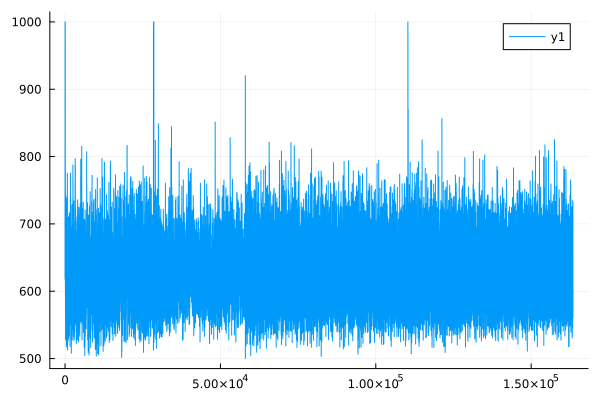

In [190]:
plot(mc_values_table.a)

In [137]:
# Creazione di un oggetto "chain" con i risultati del campionamento
chain_values = getindex.(getindex.(values(samples.parameters), :mu), 1)

# Trace Plot
plot(chain_values, seriestype = :line, legend = false, title = "Trace Plot", xlabel = "Iteration", ylabel = "mu")


# ACF Plot
#autocor = acf(chain)
#plot(autocor, seriestype = :bar, legend = false, title = "Autocorrelation Function (ACF) Plot", xlabel = "Lag", ylabel = "Autocorrelation")

LoadError: type NamedTuple has no field parameters

In [20]:
diagnostics = BAT.MCMCDiagnostics(samples::DensitySampleVector)

BAT.MCMCDiagnostics(DensitySampleVector(length = 108381, varshape = ValueShapes.ArrayShape{Float64, 1}((6,))), Any[])

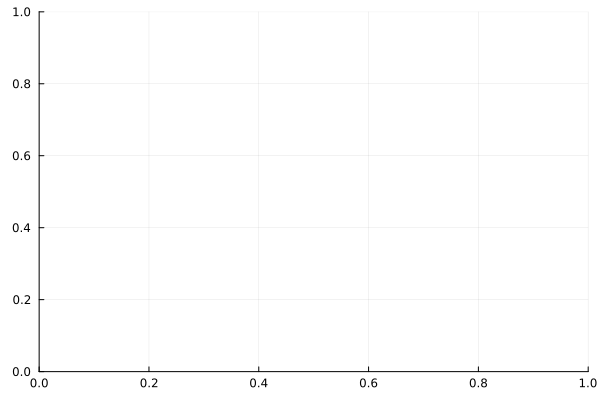

In [21]:
#pyplot()
plot(diagnostics, vsel=[1])

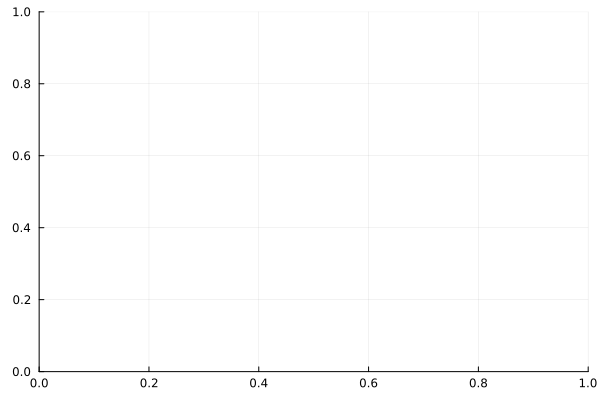

In [22]:
plot(diagnostics,
    diagnostics = [:trace, :acf],
    trace = Dict("linecolor" => :red),
    acf = Dict("lags" => collect(1:20), "title"=> "Autocorrelation"))

In [115]:
println("Mode: $(mode(samples))")
println("Mean: $(mean(samples))")
println("Stddev: $(std(samples))")

Mode: (a = 612.8905071993099, mu = [-0.20699524612211295, 3.548883041335893], sigma = [1.4161678682113552, 0.9846058233967647])
Mean: (a = 625.6011741816079, mu = [-0.16245119922532175, 3.5577600407829295], sigma = [1.4534821245806764, 0.9834073951266025])
Stddev: (a = 39.84108948105295, mu = [0.13856197645567592, 0.04531453624471972], sigma = [0.09444386228907221, 0.03211723830632706])


In [116]:
unshaped_samples, f_flatten = bat_transform(Vector, samples)

[ Info: Using transform algorithm BAT.UnshapeTransformation()


(result = DensitySampleVector(length = 104875, varshape = ValueShapes.ArrayShape{Float64, 1}((5,))), trafo = Base.Fix2{typeof(ValueShapes.unshaped), ValueShapes.NamedTupleShape{(:a, :mu, :sigma), Tuple{ValueShapes.ValueAccessor{ValueShapes.ScalarShape{Real}}, ValueShapes.ValueAccessor{ValueShapes.ArrayShape{Real, 1}}, ValueShapes.ValueAccessor{ValueShapes.ArrayShape{Real, 1}}}, NamedTuple}}(ValueShapes.unshaped, NamedTupleShape((a = ValueShapes.ScalarShape{Real}(), mu = ValueShapes.ArrayShape{Real, 1}((2,)), sigma = ValueShapes.ArrayShape{Real, 1}((2,))))), optargs = (algorithm = BAT.UnshapeTransformation(), context = BATContext{Float64}(Random123.Philox4x{UInt64, 10}(0x048fb8f5e59b8d3e, 0x8f7e1e74426b6281, 0x6e1f859bce82577e, 0xa088947a13df0d20, 0xc7772c4497f2846a, 0x30c36e073f4bc540, 0x0000000000000000, 0x0000000000000000, 0x0000000000000000, 0x80000c0600000000, 0), HeterogeneousComputing.CPUnit(), BAT._NoADSelected())))

In [117]:
par_cov = cov(unshaped_samples)
println("Covariance: $par_cov")

Covariance: [1587.3124110372735 4.230826011174373 1.2061156885325228 2.7094925323190058 -0.7903932970767933; 4.230826011174373 0.01919942131930334 0.004301134485307465 0.010166815724230213 -0.0027583485789271296; 1.2061156885325228 0.004301134485307465 0.0020534071950739905 0.002612099976135264 -0.0009079118265231241; 2.7094925323190058 0.010166815724230213 0.002612099976135264 0.008919643124077165 -0.0015936722493250122; -0.7903932970767933 -0.0027583485789271296 -0.0009079118265231241 -0.0015936722493250122 0.0010315169964253983]


In [118]:
bat_report(samples)

┌ Debug: Using integrated autocorrelation length estimator EffSampleSizeFromAC{GeyerAutocorLen}
│   acalg: GeyerAutocorLen GeyerAutocorLen()
└ @ BAT ~/.julia/packages/BAT/5U28G/src/algotypes/bat_default.jl:48


### Sampling result

  * Total number of samples: 104875
  * Total weight of samples: 399991
  * Effective sample size: between 2521 and 3638

#### Marginals

| Parameter | Mean      | Std. dev. | Gobal mode | Marg. mode |     Cred. interval      | Histogram                                                  |
|:--------- |:--------- |:--------- |:---------- |:---------- |:-----------------------:|:---------------------------------------------------------- |
| a         | 625.601   | 39.8411   | 612.891    | 630.0      |    584.332 .. 662.19    | ⠀⠀⠀⠀⠀506[⠀⠀⠀⠀⠀▁▂▃▅▆▇█████▇▅▄▃▂▂▁▁⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀[851⠀⠀⠀⠀⠀ |
| mu[1]     | -0.162451 | 0.138562  | -0.206995  | -0.15      | -0.318882 .. -0.0487357 | ⠀⠀-0.652[⠀⠀⠀⠀⠀⠀▁▂▃▅▆████▇▆▄▃▂▁▁⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀[0.79⠀⠀⠀⠀ |
| mu[2]     | 3.55776   | 0.0453145 | 3.54888    | 3.575      |   3.51093 .. 3.60032    | ⠀⠀⠀⠀3.37[⠀⠀⠀⠀⠀⠀⠀⠀⠀▁▂▂▃▅▆▇████▇▆▅▄▃▂▁⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀[3.78⠀⠀⠀⠀ |
| sigma[1]  | 1.45348   | 0.0944439 | 1.41617    | 1.425      |   1.35572 .. 1.53969    | ⠀⠀⠀⠀1.14[⠀⠀⠀⠀⠀⠀▁▂▃▅▆▇████▇▅▄▃▂▁▁⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀[2.02⠀⠀⠀⠀ |
| sigma[2]  | 0.983407  | 0.0321172 | 0.984606   | 0.99       |   0.949912 .. 1.01377   | ⠀⠀⠀0.838[⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀▁▁▂▃▄▅▇█████▇▆▅▄▃▂▁▁⠀⠀⠀⠀⠀⠀⠀⠀⠀[1.12⠀⠀⠀⠀ |


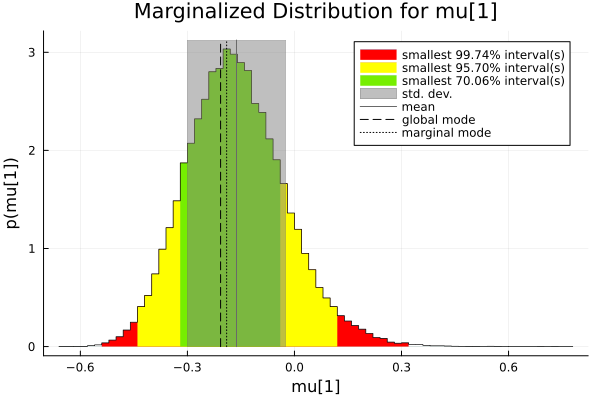

In [119]:
plot(
    samples, :(mu[1]),
    mean = true, std = true, globalmode = true, marginalmode = true,
    nbins = 100, title = "Marginalized Distribution for mu[1]"
)

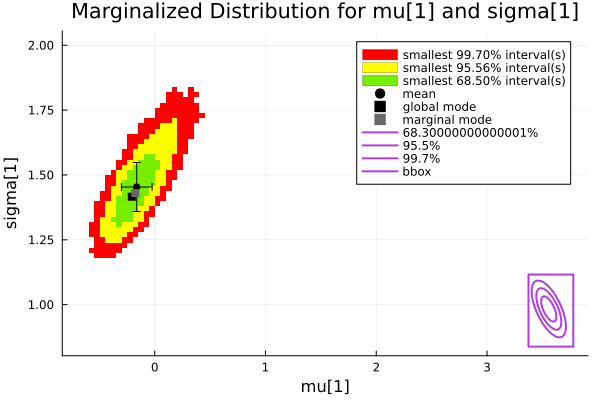

In [120]:
plot(
    samples, (:(mu[1]), :(sigma[1])),
    mean = true, std = true, globalmode = true, marginalmode = true,
    nbins = 50, title = "Marginalized Distribution for mu[1] and sigma[1]"
)
plot!(BAT.MCMCBasicStats(samples), (3, 5))

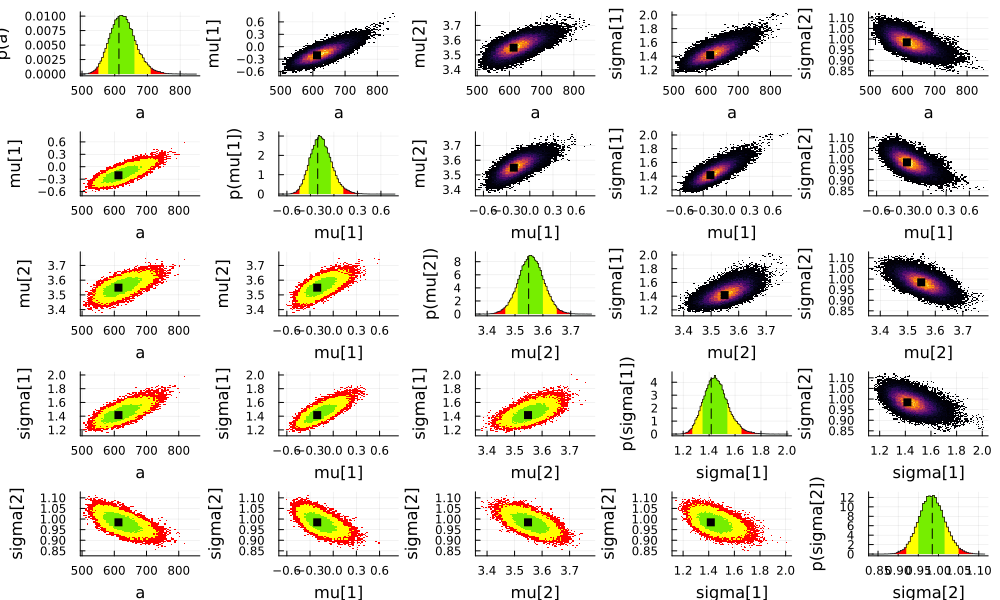

In [121]:
plot(
    samples,
    mean = false, std = false, globalmode = true, marginalmode = false,
    nbins = 100
)

In [122]:
samples_mode = mode(samples)

(a = 612.8905071993099, mu = [-0.20699524612211295, 3.548883041335893], sigma = [1.4161678682113552, 0.9846058233967647])

In [284]:
samples_mode isa NamedTuple

true

In [123]:
findmode_result = bat_findmode(
    posterior,
    OptimAlg(optalg = Optim.NelderMead(), init = ExplicitInit([samples_mode]))
)

fit_par_values = findmode_result.result

(a = 616.9617540986075, mu = [-0.19240121636809815, 3.552364715308643], sigma = [1.4273932143152575, 0.983776873962795])

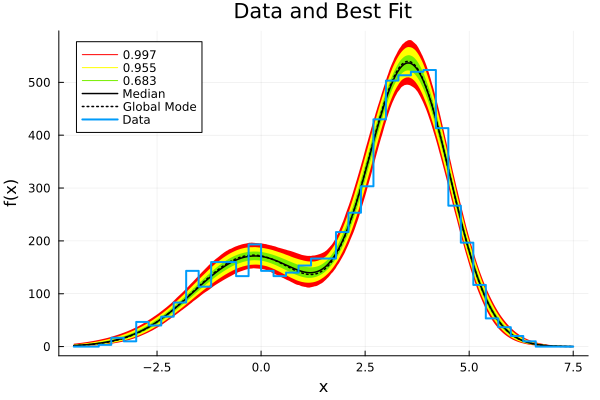

In [124]:
plot(-4.5:0.01:7.5, fit_function, samples)
plot!(
    normalize(hist,mode=:density),
    color=1, linewidth=2, fillalpha=0.0,
    st = :steps, fill=false, label = "Data",
    title = "Data and Best Fit"
)